In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
%matplotlib inline 


In [2]:
df=pd.read_csv("C:\Parking_Citations_After_July_1_2015.csv",low_memory=False)
df.head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude
0,4361370075,2019/09/17 12:00:00 AM,817.0,NaN,NaN,LA,NaN,MERC,PA,RD,1324 84TH PL W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.471017e+06,1.808559e+06
1,4361370064,2019/09/17 12:00:00 AM,811.0,VM48,NaN,CA,NaN,BUIC,PA,GN,1000 85TH ST W,00551,55.0,88.13B+,METER EXP.,63,6.473192e+06,1.808298e+06
2,4361370053,2019/09/17 12:00:00 AM,809.0,NaN,NaN,CA,NaN,TOYT,PA,GY,1000 85TH ST W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473192e+06,1.808298e+06
3,4361370042,2019/09/17 12:00:00 AM,805.0,NaN,NaN,CA,NaN,NISS,PA,BK,8021 VERMONT AVE,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473164e+06,1.810388e+06
4,4361370031,2019/09/17 12:00:00 AM,727.0,NaN,NaN,CA,NaN,HOND,PA,GY,1473 45TH ST W,00551,55.0,22500E,BLOCKING DRIVEWAY,68,6.469917e+06,1.823537e+06


In [3]:
df["Date"] = df["Issue Date"].apply(lambda x: x.split()[0])
df.head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date
0,4361370075,2019/09/17 12:00:00 AM,817.0,NaN,NaN,LA,NaN,MERC,PA,RD,1324 84TH PL W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.471017e+06,1.808559e+06,2019/09/17
1,4361370064,2019/09/17 12:00:00 AM,811.0,VM48,NaN,CA,NaN,BUIC,PA,GN,1000 85TH ST W,00551,55.0,88.13B+,METER EXP.,63,6.473192e+06,1.808298e+06,2019/09/17
2,4361370053,2019/09/17 12:00:00 AM,809.0,NaN,NaN,CA,NaN,TOYT,PA,GY,1000 85TH ST W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473192e+06,1.808298e+06,2019/09/17
3,4361370042,2019/09/17 12:00:00 AM,805.0,NaN,NaN,CA,NaN,NISS,PA,BK,8021 VERMONT AVE,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473164e+06,1.810388e+06,2019/09/17
4,4361370031,2019/09/17 12:00:00 AM,727.0,NaN,NaN,CA,NaN,HOND,PA,GY,1473 45TH ST W,00551,55.0,22500E,BLOCKING DRIVEWAY,68,6.469917e+06,1.823537e+06,2019/09/17


In [34]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 7570561 entries, 0 to 8706411
Data columns (total 20 columns):
Ticket number            object
Issue Date               object
Issue time               float64
Meter Id                 object
Marked Time              float64
RP State Plate           object
VIN                      float64
Make                     object
Body Style               object
Color                    object
Location                 object
Route                    object
Agency                   float64
Violation code           object
Violation Description    object
Fine amount              object
Latitude                 float64
Longitude                float64
Date                     object
geometry                 geometry
dtypes: float64(6), geometry(1), object(13)
memory usage: 1.2+ GB


In [35]:
df.describe()

,Issue time,Marked Time,VIN,Agency,Latitude,Longitude
count,7.569294e+06,256981.000000,0.0,7.570554e+06,7.570559e+06,7.570559e+06
mean,1.199136e+03,1051.908931,NaN,5.281639e+01,6.455689e+06,1.848732e+06
std,4.776151e+02,227.524559,NaN,6.762533e+00,2.749309e+04,2.876927e+04
min,0.000000e+00,1.000000,NaN,1.000000e+00,6.359739e+06,1.715555e+06
25%,9.090000e+02,905.000000,NaN,5.300000e+01,6.431557e+06,1.837074e+06
50%,1.153000e+03,1035.000000,NaN,5.400000e+01,6.458818e+06,1.845123e+06
75%,1.509000e+03,1200.000000,NaN,5.500000e+01,6.478120e+06,1.859549e+06
max,2.359000e+03,2400.000000,NaN,9.700000e+01,6.514332e+06,1.942669e+06


In [4]:
df['Agency'].unique()

array([55., 56., 51., 54., 53., 58.,  2.,  1., 57., 36.,  4., nan, 11.,
       49., 77.,  3., 40., 30., 41., 52.,  5.,  7., 42., 45., 50., 34.,
       15.,  9., 35., 60., 97., 32.,  8.,  6., 70., 59., 71., 61., 12.,
       10., 38., 43., 24., 13.])

In [5]:
df['Agency'].value_counts()

54.0    2100625
51.0    1940658
56.0    1849729
53.0    1584989
55.0     902486
1.0      191917
2.0       48942
57.0      31175
4.0       26048
58.0       9855
36.0       7381
3.0        4723
40.0       3817
11.0       3323
34.0        336
41.0        214
5.0          63
59.0         22
6.0          18
97.0         16
77.0         14
52.0          6
7.0           5
15.0          4
60.0          4
50.0          4
12.0          3
45.0          3
42.0          3
35.0          3
30.0          2
9.0           2
8.0           2
24.0          1
43.0          1
13.0          1
32.0          1
71.0          1
10.0          1
38.0          1
49.0          1
70.0          1
61.0          1
Name: Agency, dtype: int64

In [21]:
df['Route'].value_counts().head(100)

00600    570083
00500    330210
00401    149844
00402    148562
00403    106790
00315    102279
00309     87376
00400     72328
00483     68891
00107     64616
00310     62530
00300     59211
00356     58162
00111     57152
402A      53917
00471     52163
00472     50450
00474     46241
00141     43880
00610     43812
00442     42898
00441     41778
00667     40495
00321     40206
00476     39905
00363     38778
00601     38734
00642     38671
00361     38061
00201     37101
          ...  
00353     26117
00152     26107
00354     25436
00131     24998
00204     24451
00686     24434
00645     24341
00463     24224
00358     24129
00155     24019
00644     23969
00481     23643
00143     23624
00351     23545
00134     23415
00147     23339
00151     23253
00636     23163
00174     22496
00355     22496
00677     22320
401A      22255
6T8       22173
00137     22063
350R1     21659
00675     21623
00161     21613
00145     21505
00448     21431
00146     21408
Name: Route, Length: 100

In [9]:
df['Agency'].nunique()

43

In [20]:
df[df["Agency"] == 54]["Route"].nunique()

593

In [21]:
df[df["Agency"] == 51]["Route"].nunique()

522

In [22]:
df[df["Agency"] == 56]["Route"].nunique()

393

In [23]:
df[df["Agency"] == 53]["Route"].nunique()

382

In [24]:
df[df["Agency"] == 55]["Route"].nunique()

218

In [120]:
df["Route"].value_counts().shape

(5274,)

In [30]:
df[df["Date"]=="2019/02/04"].groupby(["Agency"]).size().sort_values(ascending=False)

Agency
56.0    1055
51.0     847
53.0     831
54.0     806
55.0     287
1.0      171
2.0       34
57.0      20
36.0       4
4.0        4
41.0       2
dtype: int64

In [6]:
df=df[df['Latitude']!=99999]
df=df[df['Longitude']!=99999]
print(df['Latitude'].min(), df['Latitude'].max())
print(df['Longitude'].min(), df['Longitude'].max())

6359739.30402891 6514332.07372465
1715555.176091 1942668.996228


In [7]:
import geopandas
from geopandas import GeoDataFrame
from shapely.geometry import Point


In [8]:
geometry = [Point(xy) for xy in zip(df["Latitude"],df["Longitude"])] 
geometry[:3]

In [9]:
crs = {'init': 'epsg:4269'} #epsg:4362(WGS84) # crs= coordinate reference system 
df = geopandas.GeoDataFrame(df,crs = crs, geometry= geometry)
df.head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date,geometry
0,4361370075,2019/09/17 12:00:00 AM,817.0,NaN,NaN,LA,NaN,MERC,PA,RD,1324 84TH PL W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.471017e+06,1.808559e+06,2019/09/17,POINT (6471016.784 1808559.113)
1,4361370064,2019/09/17 12:00:00 AM,811.0,VM48,NaN,CA,NaN,BUIC,PA,GN,1000 85TH ST W,00551,55.0,88.13B+,METER EXP.,63,6.473192e+06,1.808298e+06,2019/09/17,POINT (6473191.784 1808297.974)
2,4361370053,2019/09/17 12:00:00 AM,809.0,NaN,NaN,CA,NaN,TOYT,PA,GY,1000 85TH ST W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473192e+06,1.808298e+06,2019/09/17,POINT (6473191.784 1808297.974)
3,4361370042,2019/09/17 12:00:00 AM,805.0,NaN,NaN,CA,NaN,NISS,PA,BK,8021 VERMONT AVE,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473164e+06,1.810388e+06,2019/09/17,POINT (6473163.889 1810388.064)
4,4361370031,2019/09/17 12:00:00 AM,727.0,NaN,NaN,CA,NaN,HOND,PA,GY,1473 45TH ST W,00551,55.0,22500E,BLOCKING DRIVEWAY,68,6.469917e+06,1.823537e+06,2019/09/17,POINT (6469917.106 1823537.453)


In [24]:
route_6T8=df['Route']=='6T8'
route_350R1=df['Route']=='350R1'

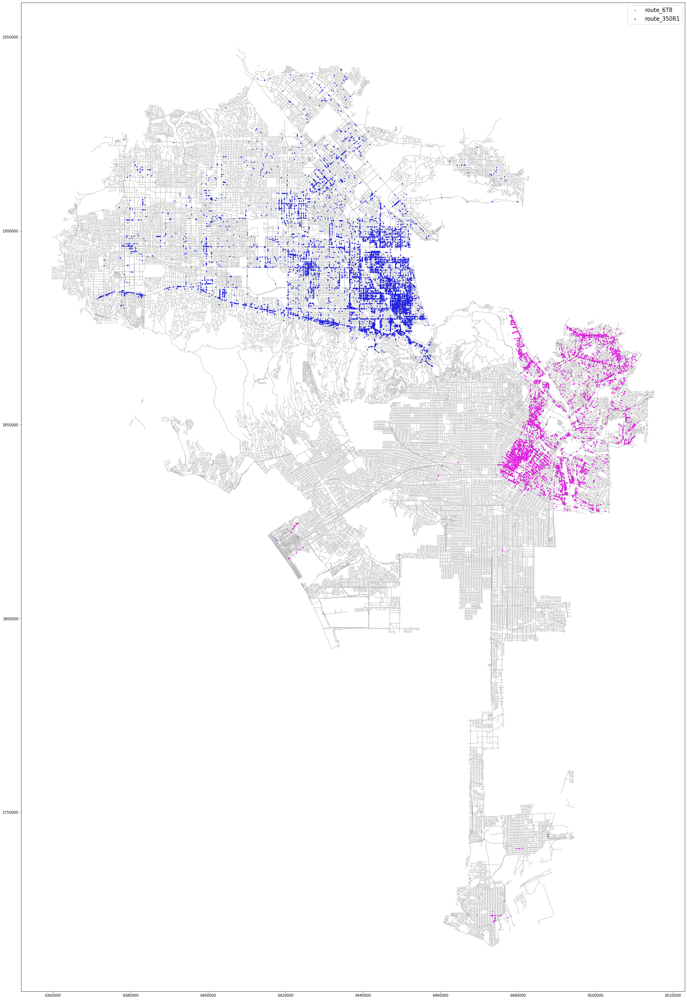

In [26]:
street_map = geopandas.read_file('Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[route_6T8].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = 'route_6T8')
df[route_350R1].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = 'route_350R1')
plt.legend(prop ={'size': 15})

In [18]:
route_00600=df['Route']=='00600'
route_00500=df['Route']=='00500'
route_00401=df['Route']=='00401'
route_00402=df['Route']=='00402'
route_00403=df['Route']=='00403'
route_00315=df['Route']=='00315'
route_00309=df['Route']=='00309'
route_00400=df['Route']=='00400'
route_00483=df['Route']=='00483'
route_00107=df['Route']=='00107'

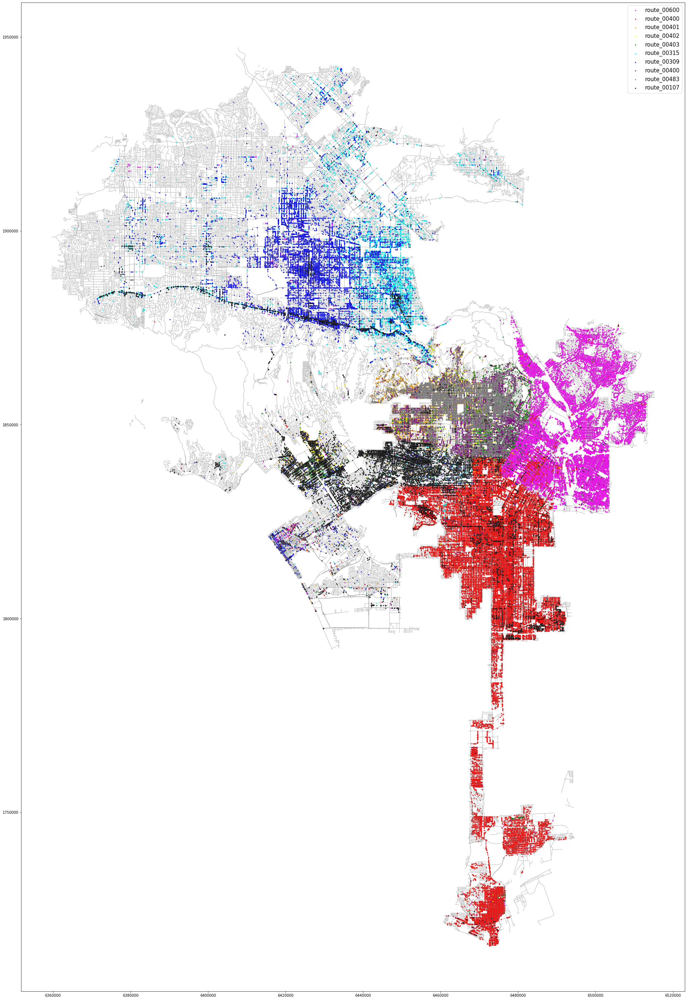

In [19]:
street_map = geopandas.read_file('Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[route_00600].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = 'route_00600')
df[route_00500].plot(ax=ax, markersize = 5 , color = 'red', marker= "^",label = 'route_00400')
df[route_00401].plot(ax=ax, markersize = 5 , color = 'orange', marker= "^",label = 'route_00401')
df[route_00402].plot(ax=ax, markersize = 5 , color = 'yellow', marker= "^",label = 'route_00402')
df[route_00403].plot(ax=ax, markersize = 5 , color = 'green', marker= "^",label = 'route_00403')
df[route_00315].plot(ax=ax, markersize = 5 , color = 'cyan', marker= "^",label = 'route_00315')
df[route_00309].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = 'route_00309')
df[route_00400].plot(ax=ax, markersize = 5 , color = 'purple', marker= "^",label = 'route_00400')
df[route_00483].plot(ax=ax, markersize = 5 , color = 'grey', marker= "^",label = 'route_00483')
df[route_00107].plot(ax=ax, markersize = 5 , color = 'black', marker= "^",label = 'route_00107')
plt.legend(prop ={'size': 15})

In [95]:
'''agency_54 =(df["Agency"]==54.0)&(df["Date"]=="2019/02/04")
agency_51 =(df["Agency"]==51.0)&(df["Date"]=="2019/02/04")
agency_56 =(df["Agency"]==56.0)&(df["Date"]=="2019/02/04")
agency_53 =(df["Agency"]==53.0)&(df["Date"]=="2019/02/04")
agency_1 =(df["Agency"]==1.0)&(df["Date"]=="2019/02/04")
agency_2 =(df["Agency"]==2.0)&(df["Date"]=="2019/02/04")
agency_57 =(df["Agency"]==57.0)&(df["Date"]=="2019/02/04")
agency_4 =(df["Agency"]==4.0)&(df["Date"]=="2019/02/04")
agency_58 =(df["Agency"]==58.0)&(df["Date"]=="2019/02/04")
agency_55 =(df["Agency"]==55.0)&(df["Date"]=="2019/02/04")'''

In [97]:
agency_54 =df["Agency"]==54.0
agency_51 =df["Agency"]==51.0
agency_56 =df["Agency"]==56.0
agency_53 =df["Agency"]==53.0
agency_1 =df["Agency"]==1.0
agency_2 =df["Agency"]==2.0
agency_57 =df["Agency"]==57.0
agency_4 =df["Agency"]==4.0
agency_58 =df["Agency"]==58.0
agency_55 =df["Agency"]==55.0

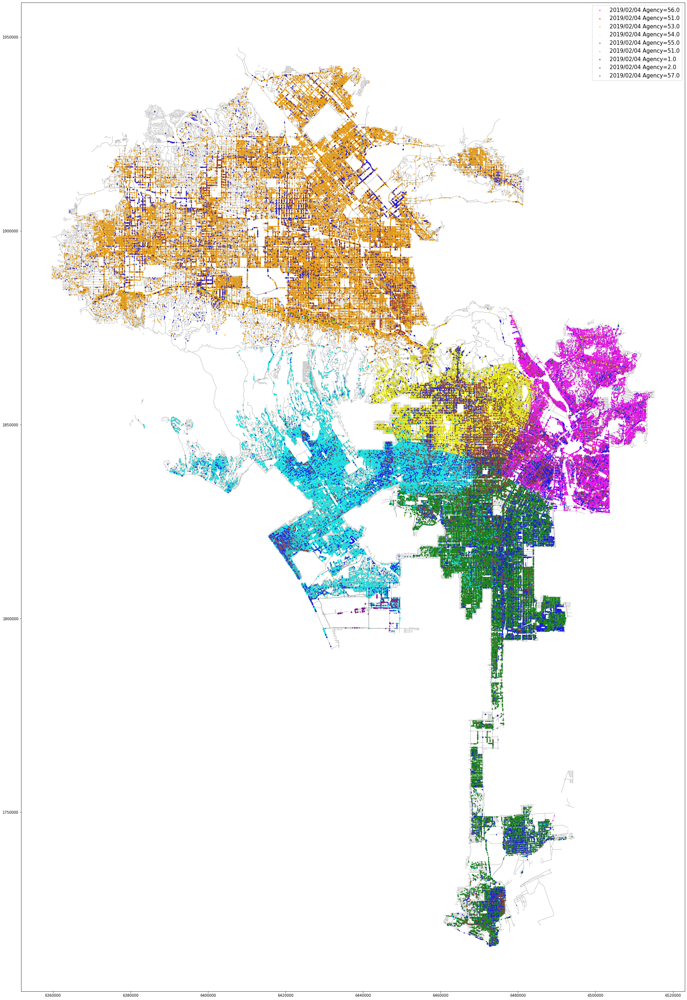

In [98]:
street_map = geopandas.read_file('Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df[agency_56].plot(ax=ax, markersize = 5 , color = 'magenta', marker= "^",label = '2019/02/04 Agency=56.0')
df[agency_51].plot(ax=ax, markersize = 5 , color = 'red', marker= "^",label = '2019/02/04 Agency=51.0')
df[agency_53].plot(ax=ax, markersize = 5 , color = 'orange', marker= "^",label = '2019/02/04 Agency=53.0')
df[agency_54].plot(ax=ax, markersize = 5 , color = 'yellow', marker= "^",label = '2019/02/04 Agency=54.0')
df[agency_55].plot(ax=ax, markersize = 5 , color = 'green', marker= "^",label = '2019/02/04 Agency=55.0')
df[agency_51].plot(ax=ax, markersize = 5 , color = 'cyan', marker= "^",label = '2019/02/04 Agency=51.0')
df[agency_1].plot(ax=ax, markersize = 5 , color = 'blue', marker= "^",label = '2019/02/04 Agency=1.0')
df[agency_2].plot(ax=ax, markersize = 5 , color = 'purple', marker= "^",label = '2019/02/04 Agency=2.0')
df[agency_57].plot(ax=ax, markersize = 5 , color = 'brown', marker= "^",label = '2019/02/04 Agency=57.0')
plt.legend(prop ={'size': 15})
   

In [36]:
df_day20190204=df[(df["Date"]=="2019/02/04") & (df['Agency']==56) & (df["Route"]=="00600")].sort_values(by='Issue time', ascending=True)
df_day20190204.head(20)
# try drawing an animation here 

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Date,geometry
995381,4347892076,2019/02/04 12:00:00 AM,44.0,NaN,NaN,FL,NaN,CHEV,PA,RD,701 4TH PL E,00600,56.0,80.56E4+,RED ZONE,93,6.489549e+06,1.839040e+06,2019/02/04,POINT (6489549.379 1839039.733)
995380,4347892080,2019/02/04 12:00:00 AM,57.0,NaN,NaN,CA,NaN,TOYT,PA,SL,756 SPRING ST S,00600,56.0,80.56E4+,RED ZONE,93,6.485157e+06,1.838581e+06,2019/02/04,POINT (6485157.485 1838580.868)
995379,4347892091,2019/02/04 12:00:00 AM,100.0,CB4397,NaN,CA,NaN,MERZ,PA,GY,800 SPRING ST S,00600,56.0,88.03A,OUTSIDE LINES/METER,58,6.484828e+06,1.838159e+06,2019/02/04,POINT (6484828.301 1838159.311)
994908,4348090235,2019/02/04 12:00:00 AM,101.0,NaN,NaN,CA,NaN,TOYT,PA,SL,3300 BALDWIN ST,00600,56.0,5204A-,DISPLAY OF TABS,25,6.499151e+06,1.848012e+06,2019/02/04,POINT (6499150.612 1848011.702)
994907,4348090246,2019/02/04 12:00:00 AM,106.0,NaN,NaN,CA,NaN,BMW,PA,WT,3300 BALDWIN ST,00600,56.0,5200,DISPLAY OF PLATES,25,6.499151e+06,1.848012e+06,2019/02/04,POINT (6499150.612 1848011.702)
994906,4348090250,2019/02/04 12:00:00 AM,112.0,NaN,NaN,CA,NaN,CHEV,PA,BL,2117 KEITH ST,00600,56.0,5204A-,DISPLAY OF TABS,25,6.500713e+06,1.847701e+06,2019/02/04,POINT (6500713.215 1847700.583)
995378,4347892102,2019/02/04 12:00:00 AM,113.0,NaN,NaN,CA,NaN,BMW,PA,GY,600 SPRING ST S,00600,56.0,80.56E1,WHITE ZONE,58,6.485641e+06,1.839201e+06,2019/02/04,POINT (6485641.284 1839201.359)
995377,4347892113,2019/02/04 12:00:00 AM,114.0,NaN,NaN,CA,NaN,HYUN,PA,SL,600 SPRING ST S,00600,56.0,80.56E1,WHITE ZONE,58,6.485641e+06,1.839201e+06,2019/02/04,POINT (6485641.284 1839201.359)
994905,4348090261,2019/02/04 12:00:00 AM,116.0,NaN,NaN,CA,NaN,TOYT,PA,GY,2107 KEITH ST,00600,56.0,5204A-,DISPLAY OF TABS,25,6.500714e+06,1.847655e+06,2019/02/04,POINT (6500713.926 1847654.683)
995376,4347892124,2019/02/04 12:00:00 AM,123.0,NaN,NaN,CA,NaN,FORD,PA,WT,900 MCGARRY ST,00600,56.0,80.69B,NO PARKING,73,6.488935e+06,1.832831e+06,2019/02/04,POINT (6488935.341 1832830.885)


In [29]:
#df[df["Issue Date"].str.contains("2019/02/09")].groupby(["Agency"]).size().sort_values(ascending=False)

Agency
54.0    1058
56.0     992
53.0     728
51.0     655
55.0     299
1.0      204
4.0       26
2.0       19
58.0       5
36.0       1
dtype: int64

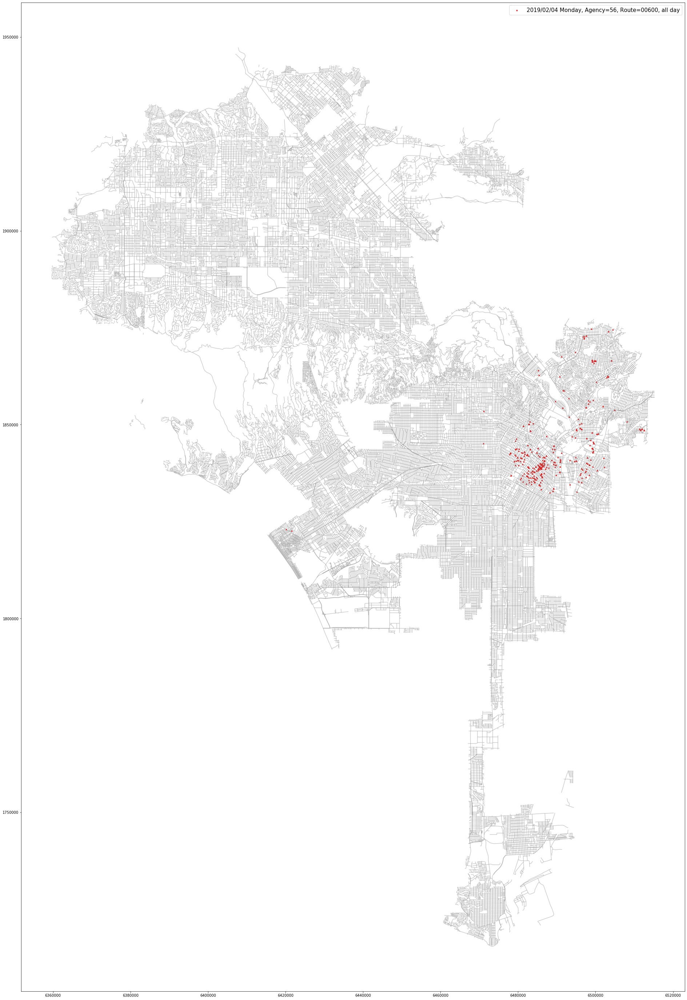

In [62]:
street_map = geopandas.read_file('Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df_day20190204.plot(ax=ax, markersize = 10 , color = 'red', marker= "^",label = '2019/02/04 Monday, Agency=56, Route=00600, all day')
plt.legend(prop ={'size': 15})


In [78]:
peak= (df_day20190204["Issue time"] > 600) & (df_day20190204["Issue time"] <= 1800)
down01 =(df_day20190204["Issue time"] > 0) & (df_day20190204["Issue time"] <= 600)
down02 =(df_day20190204["Issue time"] > 1800) & (df_day20190204["Issue time"] <= 2400)


In [42]:
#int(56/100)+1

1

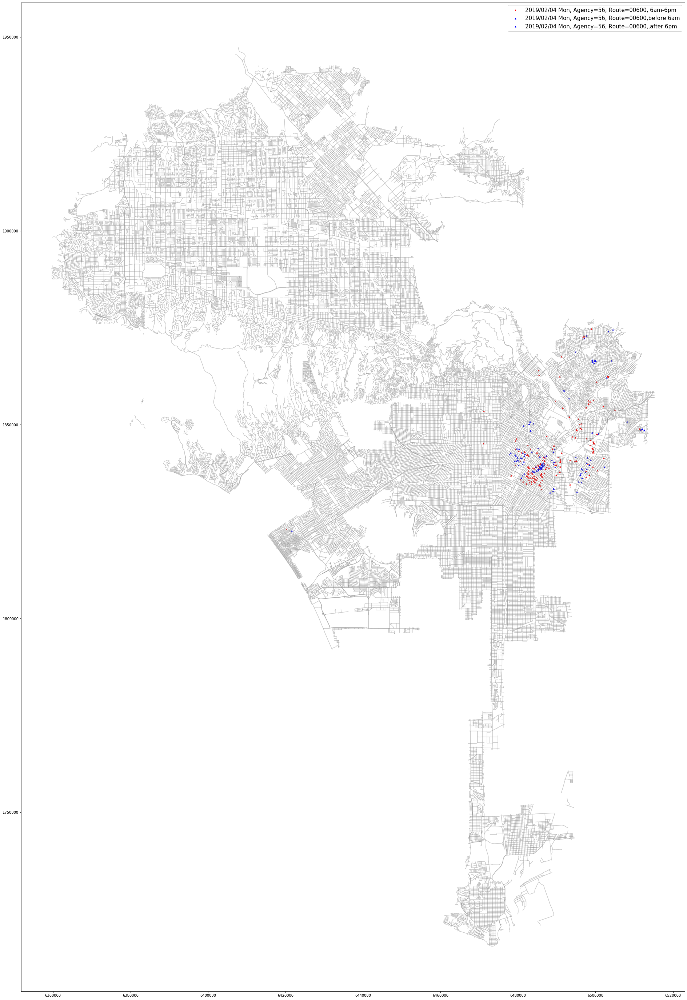

In [80]:
street_map = geopandas.read_file('Street Centerline.shp')
fig, ax = plt.subplots(figsize = (50,50))
street_map.plot(ax = ax, alpha = 0.4, color = 'grey')
df_day20190204[peak].plot(ax=ax, markersize = 10 , color = 'red', marker= "^",label = '2019/02/04 Mon, Agency=56, Route=00600, 6am-6pm')
df_day20190204[down01].plot(ax=ax, markersize = 10 , color = 'blue', marker= "^",label = '2019/02/04 Mon, Agency=56, Route=00600,before 6am')
df_day20190204[down02].plot(ax=ax, markersize = 10 , color = 'blue', marker= "^",label = '2019/02/04 Mon, Agency=56, Route=00600,,after 6pm')
#df_day20190204[pm_02].plot(ax=ax, markersize = 10 , color = 'green', marker= "^",label = '2019/02/04 Monday, Agency=56, Route=00600,6pm-12am')
plt.legend(prop ={'size': 15})

In [26]:
df[df["Issue Date"].str.contains("2019/02/09")].groupby(["Agency"]).size()

Agency
1.0      204
2.0       19
4.0       26
36.0       1
51.0     655
53.0     728
54.0    1058
55.0     299
56.0     992
58.0       5
dtype: int64

In [27]:
df[df["Issue Date"].str.contains("2019/02/02")].groupby(["Agency"]).size()

Agency
1.0     137
2.0      15
4.0       7
51.0    541
53.0    297
54.0    919
55.0    161
56.0    618
dtype: int64

In [27]:
df[df["Issue Date"].str.contains("2019/02/04")].groupby(["Route", "Agency"]).size()

Route  Agency
00001  1.0       14
00101  55.0      18
00102  51.0      15
00103  51.0      14
00105  51.0      16
00108  51.0      10
00111  51.0       3
00112  51.0       5
00113  51.0      14
00114  51.0      14
00115  51.0       6
00132  51.0       9
00133  51.0      17
00134  51.0       9
00135  51.0      14
00137  51.0      13
00141  51.0      40
00143  51.0      11
00146  51.0      10
00151  51.0      16
00152  51.0       9
00153  51.0      31
00159  51.0      26
00165  51.0       7
00174  51.0       9
00175  51.0      11
00183  51.0      22
00184  51.0      12
00185  51.0      14
00187  51.0      25
                 ..
401A   54.0      62
401B   54.0      57
402A   54.0      31
402B   54.0       6
403A   54.0      16
403B   54.0      24
478R2  54.0       5
489R1  54.0       2
501R   51.0      19
502A   51.0      10
504A   51.0       2
506A   51.0      18
506C   51.0      30
57B    57.0       9
5D81   2.0        1
5M28   2.0        1
645B   56.0      20
677R1  56.0      12
6A77  

In [33]:
df[df["Issue Date"].str.contains("2019/02/02")].groupby(["Agency", "Route"]).size()

Agency  Route
1.0     00157      1
        00363      2
        01806      1
        01879      1
        02046      1
        11EL1     10
        14A73      1
        17U1       3
        17X64      7
        19EL3      2
        1FB21      1
        1FB4       3
        20A53      4
        2A5        1
        6A77       1
        6X99       1
        8A53       5
        8A95       1
        9A41       5
        PATRO      1
        W4         1
2.0     1A104      2
        1A105      1
        1A315      1
        2A206      1
        3A206      2
        3C103      2
        3C151      1
        3C207      1
        3C7B       1
                ... 
54.0    00451     28
        00473     13
        00477     11
        00480     11
        00482      8
        00483     21
        00491     51
        00495      3
        00666     11
        401A      13
        401B      68
        402A      75
        402B      25
        403B      14
55.0    00500    129
        00562     24

In [88]:
df["Date"] = pd.to_datetime(df["Date"])

In [90]:
df.sort_values(by=["Agency", "Date", "Issue time"])

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,...,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Latitude_1,Longitude_1,Date
7565847,1067717700,2016/01/12 12:00:00 AM,150.0,NaN,NaN,CA,NaN,CHEV,TR,BK,...,00667,1.0,8056E4,RED ZONE,93,6.463660e+06,1.858863e+06,34.044502,-118.283292,2016-01-12
7565756,1110476721,2016/01/12 12:00:00 AM,1115.0,NaN,NaN,WA,NaN,HOND,PA,BK,...,01779,1.0,4000A1,NO EVIDENCE OF REG,50,6.418335e+06,1.906609e+06,34.087237,-118.181836,2016-01-12
7565782,1109141854,2016/01/12 12:00:00 AM,1115.0,NaN,NaN,CA,NaN,BMW,NaN,BK,...,35M54,1.0,4000A1,NO EVIDENCE OF REG,50,6.399657e+06,1.912673e+06,34.141436,-118.371126,2016-01-12
7565823,1108722742,2016/01/12 12:00:00 AM,1505.0,NaN,NaN,CA,NaN,FORD,SU,BK,...,MQ,1.0,225078A,HANDICAP/NO DP ID,363,6.475973e+06,1.816265e+06,34.148068,-118.369134,2016-01-12
7565805,1109341251,2016/01/12 12:00:00 AM,1520.0,NaN,NaN,CA,NaN,CHEV,PA,NaN,...,MQ,1.0,225078A,HANDICAP/NO DP ID,363,6.468016e+06,1.818569e+06,34.151028,-118.350629,2016-01-12
7565804,1109341262,2016/01/12 12:00:00 AM,1540.0,NaN,NaN,CA,NaN,LEXU,PA,BK,...,MQ,1.0,225078A,HANDICAP/NO DP ID,363,6.467667e+06,1.818571e+06,34.151028,-118.350629,2016-01-12
7565803,1109341273,2016/01/12 12:00:00 AM,1550.0,NaN,NaN,CA,NaN,TOYO,PA,RE,...,MQ,1.0,225078A,HANDICAP/NO DP ID,363,6.467714e+06,1.818570e+06,34.144836,-118.361440,2016-01-12
7565800,1109341306,2016/01/12 12:00:00 AM,1605.0,NaN,NaN,CA,NaN,TOYO,VN,BL,...,MQ,1.0,570,2251157B,363,6.468016e+06,1.818569e+06,34.172150,-118.387093,2016-01-12
7565801,1109341295,2016/01/12 12:00:00 AM,1605.0,NaN,NaN,CA,NaN,TOYO,VN,BL,...,MQ,1.0,225078A,HANDICAP/NO DP ID,363,6.468016e+06,1.818569e+06,34.144741,-118.361439,2016-01-12
7565738,1107687136,2016/01/12 12:00:00 AM,1630.0,NaN,NaN,PA,NaN,NaN,TR,WH,...,SL10,1.0,8056E1,WHITE ZONE,58,6.473465e+06,1.728692e+06,34.098145,-118.294156,2016-01-12


In [5]:
df["Agency"].nunique()

5

In [12]:
df.shape

(8706412, 18)

In [9]:
df[["Ticket number"]].min()

Ticket number    1.001096e+09
dtype: float64

In [11]:
df[["Ticket number"]].max()

Ticket number    4.361460e+09
dtype: float64

In [29]:
df=df[df['Latitude']!=99999]
df=df[df['Longitude']!=99999]
print(df['Latitude'].min(), df['Latitude'].max())
print(df['Longitude'].min(), df['Longitude'].max())
df.head()

6359739.30402891 6514332.07372465
1715555.176091 1942668.996228


,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Latitude_1,Longitude_1
0,4361370075,2019/09/17 12:00:00 AM,817.0,NaN,NaN,LA,NaN,MERC,PA,RD,1324 84TH PL W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.471017e+06,1.808559e+06,33.961646,-118.298938
1,4361370064,2019/09/17 12:00:00 AM,811.0,VM48,NaN,CA,NaN,BUIC,PA,GN,1000 85TH ST W,00551,55.0,88.13B+,METER EXP.,63,6.473192e+06,1.808298e+06,33.960946,-118.291763
2,4361370053,2019/09/17 12:00:00 AM,809.0,NaN,NaN,CA,NaN,TOYT,PA,GY,1000 85TH ST W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473192e+06,1.808298e+06,33.960946,-118.291763
3,4361370042,2019/09/17 12:00:00 AM,805.0,NaN,NaN,CA,NaN,NISS,PA,BK,8021 VERMONT AVE,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.473164e+06,1.810388e+06,33.966689,-118.291875
4,4361370031,2019/09/17 12:00:00 AM,727.0,NaN,NaN,CA,NaN,HOND,PA,GY,1473 45TH ST W,00551,55.0,22500E,BLOCKING DRIVEWAY,68,6.469917e+06,1.823537e+06,34.002795,-118.302713


In [23]:
import pyproj
from pyproj import Proj, transform

In [24]:

x, y = df["Latitude"].tolist(), df["Longitude"].tolist()
inProj = Proj(init='epsg:2229', preserve_units=True) # make sure unit preserve 
outProj = Proj(init='epsg:4326')
y_1,x_1 = transform(inProj,outProj,x,y)
df["Latitude_1"] = pd.Series(x_1)

df["Longitude_1"] = pd.Series(y_1)
print(x_1, y_1)
df.head(2)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Latitude_1,Longitude_1
0,4361370075,2019/09/17 12:00:00 AM,817.0,NaN,NaN,LA,NaN,MERC,PA,RD,1324 84TH PL W,00551,55.0,80.69BS,NO PARK/STREET CLEAN,73,6.471017e+06,1.808559e+06,33.961646,-118.298938
1,4361370064,2019/09/17 12:00:00 AM,811.0,VM48,NaN,CA,NaN,BUIC,PA,GN,1000 85TH ST W,00551,55.0,88.13B+,METER EXP.,63,6.473192e+06,1.808298e+06,33.960946,-118.291763


In [1]:
skip = pd.Series(np.random.binomial(1, 0.1, len(df)), index=df.index)

NameError: name 'pd' is not defined

In [33]:
subset = df[skip==1]

In [34]:
df.shape, subset.shape

((6782765, 20), (678810, 20))

In [38]:
#subset["Issue Date"] = pd.to_datetime(subset["Issue Date"], infer_datetime_format=True)

In [47]:
df.isnull().mean()

Ticket number            0.000000e+00
Issue Date               0.000000e+00
Issue time               1.683679e-04
Meter Id                 7.339026e-01
Marked Time              9.662430e-01
RP State Plate           1.385865e-05
VIN                      1.000000e+00
Make                     5.242700e-04
Body Style               5.014179e-04
Color                    1.820791e-04
Location                 0.000000e+00
Route                    4.240159e-03
Agency                   7.371625e-07
Violation code           0.000000e+00
Violation Description    4.349259e-05
Fine amount              2.580069e-04
Latitude                 0.000000e+00
Longitude                0.000000e+00
Latitude_1               0.000000e+00
Longitude_1              0.000000e+00
dtype: float64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7570561 entries, 0 to 8706411
Data columns (total 20 columns):
Ticket number            object
Issue Date               object
Issue time               float64
Meter Id                 object
Marked Time              float64
RP State Plate           object
VIN                      float64
Make                     object
Body Style               object
Color                    object
Location                 object
Route                    object
Agency                   float64
Violation code           object
Violation Description    object
Fine amount              object
Latitude                 float64
Longitude                float64
Latitude_1               float64
Longitude_1              float64
dtypes: float64(8), object(12)
memory usage: 1.2+ GB


In [30]:
df=df[~df['Latitude_1'].isnull()]
df=df[~df['Latitude'].isnull()]
df.isnull().sum()

Ticket number                  0
Issue Date                     0
Issue time                  1142
Meter Id                 4977889
Marked Time              6553799
RP State Plate                94
VIN                      6782765
Make                        3556
Body Style                  3401
Color                       1235
Location                       0
Route                      28760
Agency                         5
Violation code                 0
Violation Description        295
Fine amount                 1750
Latitude                       0
Longitude                      0
Latitude_1                     0
Longitude_1                    0
dtype: int64

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6782765 entries, 0 to 7570560
Data columns (total 20 columns):
Ticket number            object
Issue Date               object
Issue time               float64
Meter Id                 object
Marked Time              float64
RP State Plate           object
VIN                      float64
Make                     object
Body Style               object
Color                    object
Location                 object
Route                    object
Agency                   float64
Violation code           object
Violation Description    object
Fine amount              object
Latitude                 float64
Longitude                float64
Latitude_1               float64
Longitude_1              float64
dtypes: float64(8), object(12)
memory usage: 1.1+ GB


In [32]:
gmaps.configure(api_key='')
rdf = df[df["Violation Description"] == "RED ZONE"]
locations = rdf.iloc[:100000][["Latitude_1","Longitude_1"]]
fig = gmaps.figure()
fig.add_layer(gmaps.heatmap_layer(locations))
fig

Figure(layout=FigureLayout(height='420px'))

In [9]:
'''gmaps.configure(api_key='')
issue_time_morning = (df["Issue time"] > 800) & (df["Issue time"] < 1200)
few_data = df[issue_time_morning][df["Violation Description"] == "RED ZONE"]
locations = few_data.iloc[:10000][["Latitude_1","Longitude_1"]]
fig = gmaps.figure()
layer = gmaps.symbol_layer(locations, fill_color = "red", stroke_color = "red", scale = 1)
fig.add_layer(layer)
fig'''

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


Figure(layout=FigureLayout(height='420px'))

In [17]:
#picked 100000 samples since my computer cannot process more data than that 
gmaps.configure(api_key='')
morning_time = (df["Issue time"] > 600) & (df["Issue time"] <= 1200) & (df.iloc[:100000]["Violation Description"] == "RED ZONE")
morning_time_df = df[morning_time][["Latitude_1","Longitude_1"]]

afternoon_time = (df["Issue time"] > 1200) & (df["Issue time"] <= 1800) & (df.iloc[:100000]["Violation Description"] == "RED ZONE")
afternoon_time_df = df[afternoon_time][["Latitude_1","Longitude_1"]]

evening_time = (df["Issue time"] > 1800)  & (df.iloc[:100000]["Violation Description"] == "RED ZONE")
evening_time_df = df[evening_time][["Latitude_1","Longitude_1"]]

fig = gmaps.figure()
morning_layer = gmaps.symbol_layer(morning_time_df, fill_color = "red", stroke_color = "red", scale = 1)
afternoon_layer = gmaps.symbol_layer(afternoon_time_df, fill_color = "green", stroke_color = "green", scale = 1)
evening_layer = gmaps.symbol_layer(evening_time_df, fill_color = "blue", stroke_color = "blue", scale = 1)
fig.add_layer(morning_layer)
fig.add_layer(afternoon_layer)
fig.add_layer(evening_layer)
fig

Figure(layout=FigureLayout(height='420px'))

In [112]:
jan_2019_df = df[df["Issue Date"].str.contains("2019/02/02")]
route = jan_2019_df[(jan_2019_df["Route"] == "00101") & (jan_2019_df["Agency"] == 54)]

In [113]:
route["Issue Date"].unique()

array(['2019/02/02 12:00:00 AM'], dtype=object)

In [114]:
#route["Issue Date"].unique()

In [115]:
route["Agency"].unique()

array([54.])

In [85]:
r_df = route[route["Violation Description"] == "RED ZONE"]
r_df.head()

,Ticket number,Issue Date,Issue time,Meter Id,Marked Time,RP State Plate,VIN,Make,Body Style,Color,Location,Route,Agency,Violation code,Violation Description,Fine amount,Latitude,Longitude,Latitude_1,Longitude_1
998739,4346059734,2019/02/03 12:00:00 AM,1055.0,NaN,NaN,CA,NaN,FORD,PA,RD,700 BERENDO ST,00405,54.0,80.56E4+,RED ZONE,93,6.472576e+06,1.844260e+06,34.046905,-118.238080
998741,4346059712,2019/02/03 12:00:00 AM,931.0,NaN,NaN,CA,NaN,HOND,PA,WT,2800 JAMES M WOOD BLVD,00405,54.0,80.56E4+,RED ZONE,93,6.474106e+06,1.842852e+06,34.048446,-118.247702
998742,4346059701,2019/02/03 12:00:00 AM,929.0,NaN,NaN,CA,NaN,NISS,PA,SL,852 VERMONT AVE S,00405,54.0,80.56E4+,RED ZONE,93,6.473335e+06,1.843167e+06,34.049560,-118.245853
998743,4346059690,2019/02/03 12:00:00 AM,927.0,NaN,NaN,CA,NaN,VOLK,PA,WT,852 VERMONT AVE S,00405,54.0,80.56E4+,RED ZONE,93,6.473335e+06,1.843167e+06,34.050116,-118.276264
998744,4346059686,2019/02/03 12:00:00 AM,926.0,NaN,NaN,CA,NaN,HOND,PA,GY,852 VERMONT AVE S,00405,54.0,80.56E4+,RED ZONE,93,6.473335e+06,1.843167e+06,34.050116,-118.276264


In [116]:
gmaps.configure(api_key='')

morning_time = (r_df["Issue time"] > 0) & (r_df["Issue time"] <= 800)
locations = route[["Latitude_1","Longitude_1"]]


fig = gmaps.figure()
fig.add_layer(gmaps.heatmap_layer(locations))
fig

Figure(layout=FigureLayout(height='420px'))

In [63]:
locations

,Latitude_1,Longitude_1


In [ ]:
jan_2019_df.head()

In [11]:
gmaps.configure(api_key='')
r_df = df[df["Violation Description"] == "RED ZONE"]
t0 = r_df["Issue time"] <= 600
t1 = (r_df["Issue time"] > 600) & (r_df["Issue time"] <= 700)
t2 = (r_df["Issue time"] > 1200) & (r_df["Issue time"] <= 1300)
t3 = (r_df["Issue time"] > 1800) & (r_df["Issue time"] <= 1900)
locations0 = r_df[t0][["Latitude_1","Longitude_1"]]
locations1 = r_df[t1][["Latitude_1","Longitude_1"]]
locations2 = r_df[t2][["Latitude_1","Longitude_1"]]
locations3 = r_df[t3][["Latitude_1","Longitude_1"]]


In [12]:
fig0 = gmaps.figure()
fig0.add_layer(gmaps.heatmap_layer(locations0))
fig0

Figure(layout=FigureLayout(height='420px'))

In [22]:
fig1 = gmaps.figure()
fig1.add_layer(gmaps.heatmap_layer(locations1))
fig1

Figure(layout=FigureLayout(height='420px'))

In [23]:
fig2 = gmaps.figure()
fig2.add_layer(gmaps.heatmap_layer(locations2))
fig2

Figure(layout=FigureLayout(height='420px'))

In [24]:
fig3 = gmaps.figure()
fig3.add_layer(gmaps.heatmap_layer(locations3))
fig3

Figure(layout=FigureLayout(height='420px'))